In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import glob
from os.path import join, basename
from skimage.util import img_as_ubyte
import skimage as ski
from skimage import filters
from skimage import exposure
import pandas as pd
from tqdm import tqdm

In [2]:
# Your file paths
DATAROOT = r"E:\Documentos\01_DTU\DTU-TFM\Fotos\DOE\2\2 cropped"

image_files = sorted(glob.glob(join(DATAROOT, '*.Tif')), key=lambda x: int(basename(x).split('.')[0]))

100%|██████████| 81/81 [00:31<00:00,  2.55it/s]


CPU times: total: 0 ns
Wall time: 19.2 ms


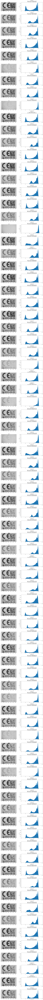

CPU times: total: 42 s
Wall time: 43.8 s


In [3]:
fig, axs = plt.subplots(len(image_files), 2, figsize=(15, 4 * len(image_files)))
# Calculate the histograms and contrast metric, and populate the subplots

# Create an empty DataFrame to store contrast results
Contrast_data = {'Image': [], 'WeberContrast': [], 'RMSContrast': []}
Contrast_df = pd.DataFrame(Contrast_data)


for i in tqdm(range(len(image_files))):
    load = cv2.imread(image_files[i])
    img = cv2.cvtColor(load, cv2.COLOR_BGR2GRAY)
    selection = img.copy()
    
    #Syntax: cv2.calcHist(images, channels, mask, histSize, ranges[, hist[, accumulate]])
    hist = cv2.calcHist([img], [0], None, [256], [0, 256])

    # Calculate Weber contrast
    max_luminance = np.max(img)
    min_luminance = np.min(img)
    weber_contrast = (max_luminance - min_luminance) / min_luminance

    # Add RMS contrast calculation inside the loop
    mean_pixel_value = np.mean(img)
    squared_diffs = (img - mean_pixel_value) **  2
    rms_contrast = np.sqrt(np.mean(squared_diffs))

    # Display the image
    axs[i, 0].imshow(selection, cmap='gray', vmin=0, vmax=256)
    axs[i, 0].set_title(f'{basename(image_files[i])}')
 
    # Display the histogram
    axs[i, 1].hist(img.ravel(),bins = 256,range=[0, 256])
    #standard devaition is directly calculated here with the numpy function
    axs[i, 1].set_title(f'Histogram {i+1}\nWeber Contrast: {weber_contrast}\nRMS Contrast: {rms_contrast}')
    axs[i, 1].set_xlabel('Intensity Value')
    axs[i, 1].set_ylabel('Count')
    axs[i, 1].set_xlim([0, 256])

    # Add results to the DataFrame
    Contrast_data['Image'].append(basename(image_files[i]))
    Contrast_data['WeberContrast'].append(weber_contrast)
    Contrast_data['RMSContrast'].append(rms_contrast)

# Save the DataFrame to a CSV file
Contrast_df = pd.DataFrame(Contrast_data)
%time Contrast_df.to_csv('Contrast_results_DOE__2-2_Alltypes.csv', index=False)

plt.tight_layout()
%time plt.show()